<a href="https://colab.research.google.com/github/ShrimanthAM/DeepLearningClass/blob/master/Chapter_5_Modern_Training_Techniques.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision 
from torchvision import transforms

from torch.utils.data import Dataset, DataLoader

from tqdm.autonotebook import tqdm

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow

import pandas as pd

from sklearn.metrics import accuracy_score

import time

from google.colab import drive
drive.mount('/content/gdrive/')
import sys
sys.path.append('/content/gdrive/My Drive/MPDL Fall 2020/')

from mpdl import train_simple_network, Flatten, weight_reset, set_seed, run_epoch

Mounted at /content/gdrive/


In [ ]:
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')

from IPython.display import display_pdf
from IPython.display import Latex

In [ ]:
torch.backends.cudnn.deterministic=True
set_seed(45)

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

At this point we have learned the basics of neural networks and three different types of architectures: fully-connected, convolutional, and recurrent. But, I've unfortunately lied to you. While all three things are widely used today, they are _not_ "modern". All three of these fundamental architecture types were invented in the 1980s and 1990s! But if all this deep learning stuff is around 40 years old, why is everyone talking about it all the sudden?

One of the major reasons the neural networks of old did not work well is that we were not that good at solving the optimization problems involved in training a neural network. Remember that this optimization, or "minimization", is what we started with in chapters 1 and 2 as the foundations of how neural networks learn. We describe a problem mathematically, and we let PyTorch sort out how to do that using _gradient descent_. There is a _second_ optimization problem we have been ignoring, which is how to choose all these hyper-parameters like number of layers, number of neurons in each layer, and so on. In this chapter we are going to learn about how to improve the gradient descent algorithm and selecting hyper parameters. While many introductory materials simply _start_ by using these more advanced methods without explaining them, my goal in starting with the original old approach is so that you can see how big a difference these changes can make. This is because improving the learning process is an active area of research, and I expect we will see new techniques for gradient descent in the future. By working our way from the past to today, you'll be better prepared to understand why and how to use new versions in the future. 

To do this, we are going to re-discuss gradient descent and how it can be broken up into two different parts: the gradient and  the learning rate _schedule_. PyTorch has special classes for both of these, so we will write a new `train_network` function that will replace the `train_simple_network` function we have seen through the book that incorporates both of these abstractions. Once we have this new code in hand we can talk about and test the different alternatives for adjusting the learning rate schedule and gradients. With that done, we can then learn about a powerful library called `Optuna` that was designed to make hyper-parameter optimization easier, and the special features it supports that work with PyTorch to help you find better hyper-parameters. 


# Gradient Descent In Two Parts

Remember that everything we do in deep learning works by treating the network as one giant function $f_\Theta(\boldsymbol{x})$, where we need to use the gradient ($\nabla$) with respect to the parameters ($\Theta$) of $f$ to adjust its weights. So we perform:

$$\Theta_{t+1} = \Theta_t - \eta \cdot \underbrace{\nabla_{\Theta_t} f_{\Theta_t}(\boldsymbol{x})}_{\boldsymbol{g}^t}$$

This is called gradient descent, and is the basis for how all modern training of neural networks is done. However, there is room for significant improvement in how we perform this critical step. We are going to use $\boldsymbol{g}^t$ as short hand for the gradient, since we are going to be talking about it a _lot_ in this section. Notice that we included this ${}^t$ super-script, as if it was part of a sequence. Thats because when we learn we get a new gradient for every batch of data we process, so our model is learning from a sequence of gradients! Well use this to our advantage later one. 

Lets discuss the problems with the above update equation. First, there is an issue with the learning rate $\eta$. We choose _one_ learning rate for _all_ of the optimization process. This can be an unreasonable expectation! Consider, as an analogy, a train driving from one city to another. The train does not travel _full speed_ and then instantaneously come to a stop once we reach the destination. Instead, the train slows down as the destination approaches. Otherwise, the train would go barreling past the destination! 

So the first type of improvement we can discuss is to alter the learn rate $\eta$ as a function of how far along we are in the optimization process ($t$). Lets call this function $L$, and give it an _initial_ learning rate $\eta_0$ and the current iteration step $t$ as inputs. 

$$\Theta_{t+1} = \Theta_t - L(\eta_0, t) \cdot \boldsymbol{g}^t$$

We will review the details on how we define $L(\eta_0, t)$ in a little bit. Right now the important thing is to understand that we have created an abstraction for altering the learning rate, and this abstraction is called a _learning rate schedule_. We can use this to replace $L$ with different schedules based on our needs or problem! Before we start showing this with code, we will need to discuss a second part of the update equation that is tightly coupled with the learning rate schedule $L(\cdot, \cdot)$ in PyTorch. 

This section part does not have a satisfying name, PyTorch calls it the "Optimizer" but that also describes the process as a whole. Still, we will use that name since its the most common - and its for how we _use_ the gradient $\boldsymbol{g}^t$. All of the information and "learning" comes from $\boldsymbol{g}^t$, it controls what the network learns and how well it is learned. The learning rate $\eta$ simply controls how quickly we follow that information. But the gradient $\boldsymbol{g}^t$ is only as good as the data we use to train the model. If our data is noisy, so too, our gradients will noisy. 

Say, for example, that we sometimes get a gradient $\boldsymbol{g}^t$ that is just _too large_. Mathematically, that would be a situation where $\|\boldsymbol{g}^t\|_2 \to \infty$. If we use that gradient, we could end up taking a far larger step than we ever intended, and that can degrade our even completely prevent us from learning. This situation is fairly common, and is a phenomena called _exploding gradients_. The opposite situation occurs too, the gradient could be too small $\|\boldsymbol{g}^t\|_2 \to 0$ causing us to make no progress toward training. The next figure shows how these situations might look for a toy problem. Remember that optimization also means _minimization_, so our neural network learning means going from a high value (red) down to a low value (green). 

![A toy example showing three different scenarios for gradient descent. Each is a contour-plot of a 2D optimization, going from red (high values, bad) to dark green (low values, good). The ideal case is in the top left, where each gradient heads exactly toward the solution. The top right shows _noisy_ gradients causing the descent to head in not-quite the correct direction, requiring more steps. The bottom left shows exploding gradients, where we begin to take steps that are far too large and head away from the solution. The bottom right shows vanishing gradients, where the gradient becomes so small we have to take an excessive number of steps to get to the solution. ](https://drive.google.com/uc?export=view&id=1VobQgiSV4e74Qa64HQ4xvrUtHYK-gLUw)

All of these situations are ones were naively using the raw gradient $g^t$ could mislead us. Again, we probably want to introduce some abstraction that will take $g^t$ in as input and do something more clever to avoid these situations. Well call that function $G$ that  _alters_ the gradient, to make it better behaved and help accelerate the learning. So now we again update our equation, and get:


$$\Theta_{t+1} = \Theta_t - L(\eta_0, t) \cdot G(\boldsymbol{g}^t)$$


So now we have a "new" gradient descent equation. It has all the base components as before, but some extra abstractions to make it more flexible. These two strategies, adjusting the learning rate and gradient, are ubiquitous in modern deep learning. As such, they both have interfaces in PyTorch. So lets define a new version of our `train_simple_network` function we have been using, that allows for these two kinds of improvements. We can then use this new function to compare the effect of these new techniques, and continue to use them later in this course.



## Implementing Optimizers and Schedulers

PyTorch provides two interfaces for us to implement the $L(\cdot, \cdot)$ and $G(\cdot)$ functions we have described. First is the `torch.optim.Optimizer` class that you have already been using. We've been using a naive `SGD` optimizer thus far, but that will now change. The new class is `_LRScheduler`  which has a number of options for us to choose from. To implement our `train_network` function, well make just a few modifications to the `train_simple_network` code. The first thing we are going to change is the function signature so that there are two new options available, namely the optimizer and scheduler! The new signature is below, with `optimizer` for $G(\cdot)$ and `lr_schedule` for $L(\cdot, \cdot)$ respectively. 

```python
def train_network(model, loss_func, train_loader, val_loader=None,
    test_loader=None, score_funcs=None, epochs=50, device="cpu", 
    checkpoint_file=None, optimizer=None, lr_schedule=None):
```

Notice that we set both to have a `None` default value. Specifying a schedule is _always_ optional, and you may want to change the schedule used depending on the task at hand. Some problems take just a few epochs, some take hundreds to a thousands, and both of these factors change with how much data you have. For these reason's I don't like _requiring_ a learning rate schedule to _always_ be used. I like to work without one first, and add one based on the problem at hand. However, we must _always_ use some kind of optimizer! So if none is given, well add the below code to use a good default (and we will get to how it works later in this chapter). 

```python
if optimizer == None:
    #The AdamW optimizer is a good default optimizer
    optimizer = torch.optim.AdamW(model.parameters())
```

Suprisingly, we are half way to being done with the new code! We do not need to make any changes to the `run_epoch` method from before, it will remain the same. That is because it is customary to alter the learning rate after each _epoch_ rather than each _batch_ (and an epoch is made up of many batches). So after our `run_epoch` function is done, we can add the following code:

```python
#In PyTorch, the convention is to update the learning rate after every epoch
if lr_schedule is not None:
    if isinstance(lr_schedule, ReduceLROnPlateau):
        lr_schedule.step(val_running_loss)
    else:
        lr_schedule.step()
```
Again, we will learn about `ReduceLROnPlateau` in a moment. It is an idiosyncratic and special member of the learning rate scheduler family that requires an extra argument. Otherwise, we simply call the `step()` function at the end of each epoch, and the learning rate schedule will be updated automatically. You may recognize this as the same approach we use for the `Optimizer` class inside of `run_epoch` which calls `optimizer.step()` at the end of every batch. This is an intentional design choice to make the two closely coupled classes consistent. 

Just to help bring the whole picture together, below is the entire code block for our new `train_nework` function. Its worth noting that our original `train_simple_network` could have been used for _every_ example in this book, the results would have just not been as good. The new code is two optional additions that make a big impact on the quality. 


In [ ]:
def train_network(model, loss_func, train_loader, val_loader=None, test_loader=None,score_funcs=None, 
                         epochs=50, device="cpu", checkpoint_file=None, 
                         lr_schedule=None, optimizer=None, disable_tqdm=False
                        ):
    """Train simple neural networks
    
    Keyword arguments:
    model -- the PyTorch model / "Module" to train
    loss_func -- the loss function that takes in batch in two arguments, the model outputs and the labels, and returns a score
    train_loader -- PyTorch DataLoader object that returns tuples of (input, label) pairs. 
    val_loader -- Optional PyTorch DataLoader to evaluate on after every epoch
    test_loader -- Optional PyTorch DataLoader to evaluate on after every epoch
    score_funcs -- A dictionary of scoring functions to use to evalue the performance of the model
    epochs -- the number of training epochs to perform
    device -- the compute lodation to perform training
    lr_schedule -- the learning rate schedule used to alter \eta as the model trains. If this is not None than the user must also provide the optimizer to use. 
    optimizer -- the method used to alter the gradients for learning. 
    
    """
    if score_funcs == None:
        score_funcs = {}#Empty set 
    
    to_track = ["epoch", "total time", "train loss"]
    if val_loader is not None:
        to_track.append("val loss")
    if test_loader is not None:
        to_track.append("test loss")
    for eval_score in score_funcs:
        to_track.append("train " + eval_score )
        if val_loader is not None:
            to_track.append("val " + eval_score )
        if test_loader is not None:
            to_track.append("test "+ eval_score )
        
    total_train_time = 0 #How long have we spent in the training loop? 
    results = {}
    #Initialize every item with an empty list
    for item in to_track:
        results[item] = []

    if optimizer == None:
        #The AdamW optimizer is a good default optimizer
        optimizer = torch.optim.AdamW(model.parameters())

    #Place the model on the correct compute resource (CPU or GPU)
    model.to(device)
    for epoch in tqdm(range(epochs), desc="Epoch", disable=disable_tqdm):
    
        model = model.train()#Put our model in training mode
        running_loss = 0.0
        
        total_train_time += run_epoch(model, optimizer, train_loader, loss_func, device, results, score_funcs, prefix="train", desc="Training")
        
        results["epoch"].append( epoch )
        results["total time"].append( total_train_time )
        
      
        if val_loader is not None:
            model = model.eval() #Set the model to "evaluation" mode, b/c we don't want to make any updates!
            with torch.no_grad():
                run_epoch(model, optimizer, val_loader, loss_func, device, results, score_funcs, prefix="val", desc="Validating")
                
        #In PyTorch, the convention is to update the learning rate after every epoch
        if lr_schedule is not None:
            if isinstance(lr_schedule, torch.optim.lr_scheduler.ReduceLROnPlateau):
                lr_schedule.step(results["val loss"][-1])
            else:
                lr_schedule.step()
                
        if test_loader is not None:
            model = model.eval() #Set the model to "evaluation" mode, b/c we don't want to make any updates!
            with torch.no_grad():
                run_epoch(model, optimizer, val_loader, loss_func, device, results, score_funcs, prefix="test", desc="Testing")
        
        if checkpoint_file is not None:
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'results' : results
                }, checkpoint_file)

    return pd.DataFrame.from_dict(results)

Now that we have a new loading function implemented, lets train a neural network! We will use the FashionMNIST dataset becasue it is slightly more challenging, while retaining the same size and shape as the original MNIST corpus, which will let us accomplish some testing in a reasonable time.

Below we will load FashMNIST, define a multi-layer fully connected network, and then train it an a manner equivalent to using our old `train_simple_network` method. To do this, we need slightly more ceremony by specifying the SGD optimizer ourselves. 

In [ ]:
print("keep my notebook alive")

keep my notebook alive


In [ ]:
epochs = 50 #50 epochs of training
B = 256 # a respectable average batch size

In [ ]:
train_data = torchvision.datasets.FashionMNIST("./data", train=True, transform=transforms.ToTensor(), download=True)
test_data = torchvision.datasets.FashionMNIST("./data", train=False, transform=transforms.ToTensor(), download=True)

train_loader = DataLoader(train_data, batch_size=B, shuffle=True)
test_loader = DataLoader(test_data, batch_size=B)

Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw


Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw


Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw
Processing...
Done!


/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:469: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


Now we will write some more familiar code, a fully-connected network with three hidden layers. 

In [ ]:
#How many values are in the input? We use this to help determine the size of subsequent layers
D = 28*28 #28 * 28 images 
#Hidden layer size
n = 128 
#How many channels are in the input?
C = 1
#How many classes are there?
classes = 10


fc_model = nn.Sequential(
    nn.Flatten(),
    nn.Linear(D,  n),
    nn.Tanh(),
    nn.Linear(n,  n),
    nn.Tanh(),
    nn.Linear(n,  n),
    nn.Tanh(),
    nn.Linear(n, classes),
)

Last, we need to settle on a default starting learning rate $\eta_0$. If we do not provide any kind of learning rate schedule $L(\cdot, \cdot)$, then $\eta_0$ will be used for every epoch of training. Well use $\eta_0=0.1$ which is more aggressive (read, _large_ ) than you usually want. I am picking this larger value to make it easier to show the  impacts of the different schedules we can choose from. 

In [ ]:
eta_0 = 0.1

With that in place, we can define a naive `SGD` optimizer the same as we did before. We just need to explicitly call `torch.optim.SGD` and pass it in ourselves, which you can see in the below code. Notice that we set the default learning rate $\eta_0$ in the `optimizer`'s constructor. This is the standard process in PyTorch, and any `LRschedule`  object we might use will reach into the `optimizer` object to alter the learning rate. 

In [ ]:
loss_func = nn.CrossEntropyLoss()

#Using our new tran_network function in a maner equivalent to what we might have done previously
fc_results = train_network(fc_model, loss_func, train_loader, val_loader=test_loader,
                                 epochs=epochs, optimizer=torch.optim.SGD(fc_model.parameters(), lr=eta_0), 
                                 score_funcs={'Accuracy': accuracy_score}, device=device)

Just like before, we can use seaborn with the return `fc_results` Pandas dataframe to quickly plot the results. The below code and figure show the kinds of results we get, clearly learning with more training but having occasional regressions. This is because our learning rate is a bit too aggressive, but its the kind of behavior you often see on real world problems with non-aggressive learning rates (like $\eta_0 =0.001$). 

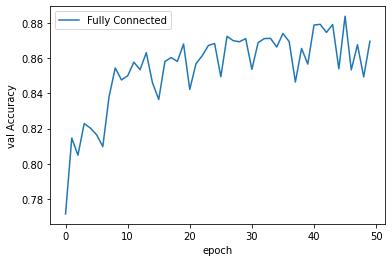

In [ ]:
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results, label='Fully Connected')

# Different Learning Rate Schedules 

Now lets talk about different ways to implement the learning rate adjustment  ($L(\eta_0, t)$) we described above. In PyTorch, these are called _learning rate schedulers_, and they take the `optimizer` object as an input. This is because they will directly alter the learning rate $\eta$ used within the `optimizer` object. 

We will talk about four different approaches to adjusting the learning rate that you should be aware of. For most of the content of this book, we are using very few training iterations 10-50, in order to keep the examples to something that will run in a reasonable amount of time. When you work on a problem in real life, it is common to train for at least 100 to 500 epochs, often many more. The more epochs of training you perform, the bigger the impact a learning rate schedule can have because there are more opportunities to alter the learning rate.  So while we may not use these heavily in the rest of this course, you should still be aware of them! 

We will first talk about four of the most fundamental learning rate schedules you will find in modern use, and the kinds of minimization issues they help resolve and how. We'll be talking about these at an _intuitive_ level, as proving these kinds of things is more math than we want to do in this book! Once we have reviewed all four approaches, well do a bake-off to compare their results.

## Exponential Decay

The first approach we will discuss may not be the most common, but is one of the simplest. It is called an _exponential decay rate_. The idea is we pick a value $0 < \gamma < 1$ the is multiplied by our learning rate after every epoch. It is defined by the below function, where $t$ represents the current epoch. 

$$\eta_t = L_\gamma(\eta_0, t) = \eta_0 \cdot \gamma^t$$

PyTorch provides this using the `torch.optim.lr_scheduler.ExponentialLR` class. Because we usually do many epochs, it is important to make sure $\gamma$ is not set too aggressively. For this reason, its a good idea to start out with a final learning rate you have in mind, and call that $\eta_{min}$. Then if you are going to train for a total of $T$ epochs, you can set:

$$\gamma = \sqrt[T]{\eta_{min}/\eta_0}$$

This will ensure that you pick a value of $\gamma$ that reaches you desired minimum, and results in learning throughout. 

For example, say the initial learning rate is $\eta_0=0.001$, and you want the minimum to be $\eta_{min}=0.0001$, and you are going to train for $T=100$ epochs. Then you need to set $\gamma \approx 0.95499$. The below plot simulates this process and shows how to write the code to calculate $\gamma$. 

Text(0, 0.5, 'Learning Rate')

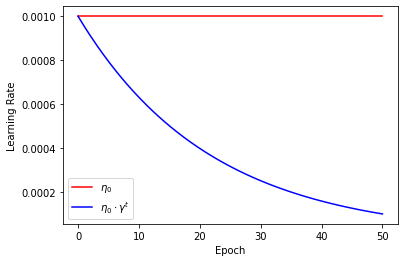

In [ ]:
T=50 #total epochs
epochs_input = np.linspace(0, 50, num=50)
eta_init = 0.001 #pretend initial learning rate
eta_min = 0.0001 #pretend desired minimum learning rate
gamma = np.power(eta_min/eta_init,1./T)

effective_learning_rate = eta_init*np.power(gamma, epochs_input)

sns.lineplot(x=epochs_input, y=eta_init, color='red', label="$\eta_0$")
ax = sns.lineplot(x=epochs_input, y=effective_learning_rate, color='blue', label="$\eta_0 \cdot \gamma^t$")
ax.set_xlabel('Epoch')
ax.set_ylabel('Learning Rate')

The exponential learning rate schedule helps solve a problem were you can get _near_ the solution, but can't quite make it _to_ the solution. The below figure shows how this happens. 

![Example of the minimization problem that an exponential learning rate helps solve. When you are far away from the solution a large $\eta$ helps you get to the right _area_ faster. But once in the right area, $\eta$ is too large to _reach_ the best solution. Instead it keeps over-shooting the local minima. ](https://drive.google.com/uc?export=view&id=1RnTpF7hPd5ZHe50u-2LWb2PubE7HWTb1)

Going back to our analogy about the train traveling to it's destination. Going _fast_ is great when you are _far away_ from your goal, because it gets you closer faster! But once you are near your destination, its a good idea to _slow down_. If a train station was only 100 feet away and the train was going 100 miles per hour, it would end up barrelling past the station and headed off in the wrong direction! You want the train to start slowing down so it can reach a precise location, and thats what the exponential learning rate does. 

![By shrinking $\eta$ at every step, the optimization "slows down" as it gets closer to the destination. This helps it converge to the local minima, instead of bouncing around it. ](https://drive.google.com/uc?export=view&id=1kqkZgGMk8IVN6FzO25SDSjF-Yd0HzMW1)

The trick to using the exponential learning rate well is in setting $\eta_{min}$. I usually recommend making it 10 to 100 times smaller than $\eta_0$. A reduction of 10-100$\times$ is normal in machine learning and a theme you will see across the schedules we use. The below code shows how we can create the exponential decay schedule by passing in the `optimizer` as an argument at construction. We also use the first line to simply re-set the learned weights to be random so that we don't have to keep re-specifying the same neural network over and over again. 

In [ ]:
fc_model.apply(weight_reset)

eta_min = 0.0001

gamma_expo = (eta_min/eta_0)**(1/epochs)

optimizer = torch.optim.SGD(fc_model.parameters(), lr=eta_0)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma_expo)

fc_results_expolr = train_network(fc_model, loss_func, train_loader, val_loader=test_loader,
                                 epochs=epochs, optimizer=optimizer, lr_schedule=scheduler,
                                 score_funcs={'Accuracy': accuracy_score}, device=device)

## Step Drop Adjustment 

The second strategy is a variant of the Exponential decay we just discussed. The idea is that, instead of constantly adjusting the learning rate ever so slightly, we should let the learning rate stay fixed for a time period, and then drop it dramatically onces. The logic behind this is that early in the optimization we are still far away from the solution, so we should go as fast as we can --- but the exponential decay takes place immediately and is their for counter productive (at least in the beginning)! So instead lets keep at our maximum speed, and simply drop the learning rate instantaneously once or twice. That way we are going at max-speed for as long as possible, but eventually slowing down to converge on the solution. 

Say we want to drop the learning rate every $S$ epochs, we obtain 

$$\eta_t = L(\eta_0, t, \gamma, S) = \eta_0 \cdot \gamma^{\left\lfloor t/S \right\rfloor}$$

In this case, we normally set $\gamma$ to a value in the range of $0.1, 0.5$, and set $S$ such that the learning rate is adjusted only two or three times during training. Again, PyTorch provides this for you using the `StepLR` class. The below plot adds what a StepLR might look like compared to the exponential decay, were you can see that it has a higher learning rate for _most_ of the epochs, but a lower learning rate for longer at the end of training. 

Text(0, 0.5, 'Learning Rate')

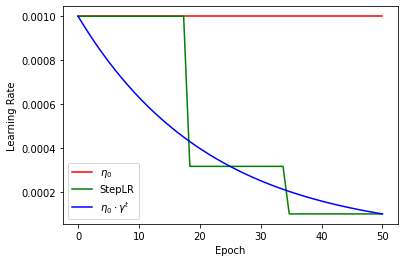

In [ ]:
sns.lineplot(x=epochs_input, y=eta_init, color='red', label="$\eta_0$")
sns.lineplot(x=epochs_input, y=[eta_init]*18+[eta_init/3.16]*16+[eta_init/10]*16, color='green', label="StepLR")
ax = sns.lineplot(x=epochs_input, y=effective_learning_rate, color='blue', label="$\eta_0 \cdot \gamma^t$")
ax.set_xlabel('Epoch')
ax.set_ylabel('Learning Rate')

Again, like all learning rate schedules we pass the `optimizer` in at construction time.  This is shown in the below code were we train with 4 drops in learning rate each by a factor of $\gamma=0.3$. 

In [ ]:
fc_model.apply(weight_reset)

optimizer = torch.optim.SGD(fc_model.parameters(), lr=eta_0)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, epochs//4, gamma=0.3)

fc_results_steplr = train_network(fc_model, loss_func, train_loader, val_loader=test_loader,
                                 epochs=epochs, optimizer=optimizer, lr_schedule=scheduler,
                                 score_funcs={'Accuracy': accuracy_score}, device=device)

## Cosine Annealing

This next learning rate is an odd, but effective one, called _cosine annealing_. We will still have an initial learning rate $\eta_0$ and a minimum rate $\eta_{min}$. The difference here is that we will alternate between the minimum and maximum learning rates! The math for this follows the below equation, where $T_{max}$ is the number of epochs between cycles. 

$$\eta_t = \eta_{min} + \frac{1}{2} \left(\eta_0 - \eta_{min}\right) \left(1 + \cos\left(\frac{t}{T_{max}} \cdot \pi \right)\right) $$

The way this learning rate schedule works is that the $\cos$ term will fluctuate up-and-down like the cosine-function normally does, and we are re-scaling it cosine to have a maximum at $\eta_0$ instead of 1, and a minimum at $\eta_{min}$ instead of -1. PyTorch provides this with the `CosineAnnealingLR` class and you can see the below code showing three rounds of the cosine schedule.  

Text(0, 0.5, 'Learning Rate')

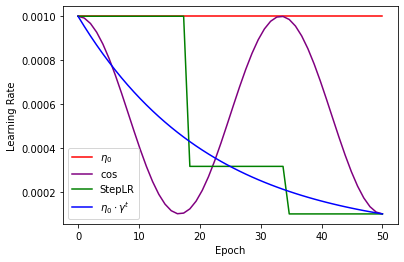

In [ ]:
cos_lr = eta_min + 0.5*(eta_init-eta_min)*(1+np.cos(epochs_input/(T/3.0)*np.pi))

sns.lineplot(x=epochs_input, y=eta_init, color='red', label="$\eta_0$")
sns.lineplot(x=epochs_input, y=cos_lr, color='purple', label="$\cos$")
sns.lineplot(x=epochs_input, y=[eta_init]*18+[eta_init/3.16]*16+[eta_init/10]*16, color='green', label="StepLR")
ax = sns.lineplot(x=epochs_input, y=effective_learning_rate, color='blue', label="$\eta_0 \cdot \gamma^t$")
ax.set_xlabel('Epoch')
ax.set_ylabel('Learning Rate')

At first glance, this cosine schedule does not make sense. Why would we want to fluctuate the learning rate up and down? It makes more sense when we remember that neural networks are not _convex_. A convex function has only one local minima, and _every_ gradient leads us to the optimal solution. But neural networks are non-convex and can have many local minima, which may not be as good a solution. If our model first heads towards one of these local minima, and we only decrease the learning rate, we may get stuck in this sub-optimal area. 

![If we get an unlucky starting point our search may take us to the sub-optimal minimal (light green). If we shrink the learning rate, our search may get stuck. The only way to escape is to increase the learning rate. ](https://drive.google.com/uc?export=view&id=1tsnqGliLjDrFmUderQxCoD-4sh0lkxV6)

If we instead shrink and then later increase the learning rate, we can give our model a change to escape the current local minima and find a new alternative minima instead (hopefully a better one). The larger learning rate hopefully gets us to a new area, and the decay again allows us to hone in on a more refined solution. 

![Gradient descent first takes us to the sub-optimal minima, but as the learning rate increases again we bounce out of the area and toward the better solution. The search will continue to bounce around the better solution until the cosine schedule again decreases the learning rate, allowing the model to converge toward a more precise answer. ](https://drive.google.com/uc?export=view&id=1WNEzKvmV4faGNcP1Q5PROWLK9MCalBIV)

You may be wondering, what stops us from bouncing out of a better solution into a worse one? Well, technically nothing stops that from happening. However, researchers have developed a lot more theory about neural networks that gives us some confidence that bouncing out of a good solution is unlikely. The gist of these results is that gradient descent likes to find "wide basins" as good solutions, were it would be difficult for the optimization to bounce out because the solution is a "wide" one. This gives us a little more confidence that this crazy cosine schedule is a good idea, and empirically it has performed well on a number of tasks. In fact, cosine annealing has been so successful that there have been dozens of proposed alternatives! 

The code to implement this approach again is very similar! In this example I've decided to use `epochs//3` for the $T_{max}$ value, which means it will perform two dips. I always stick with an odd number for the divisor of epochs so that the learning ends with a dip down to a small learning rate. 

In [ ]:
fc_model.apply(weight_reset)

optimizer = torch.optim.SGD(fc_model.parameters(), lr=eta_0)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs//3, eta_min=0.0001)

fc_results_coslr = train_network(fc_model, loss_func, train_loader, val_loader=test_loader,
                                 epochs=epochs, optimizer=optimizer, lr_schedule=scheduler,
                                 score_funcs={'Accuracy': accuracy_score}, device=device)

\title{Many Friends and Flavors of Cosine Annealing} Cosine annealing is an effective learning rate schedule all on its own, but its original design was for a slightly different purpose. You may recall that _ensembling_ is a great way to improve your predictive accuracy on a task: just train a bunch of different models, and average your predictions to get a final, better, answer! But training 20-100 neural networks just to average them together is very expensive. Thats where cosine annealing comes in! Instead of training 20 models, train _one_ model with cosine annealing, and every time the learning rate bottoms out take a copy of those weights and use that as one of your models! So if you wanted an ensemble of 100 networks you would use $T_{max} = T/(20\cdot 2) + 1$. This would result in exactly 20 dips of the learning rate. 

Since PyTorch 1.6, an even fancier version of this called _stochastic weight averaging_ (SWA) is [built-in](https://pytorch.org/docs/stable/optim.html#stochastic-weight-averaging) and available for you to use. With SWA you can instead _average_ the parameters $\Theta$ from each of these dips, giving you _one_ model that is closer in accuracy to an ensemble of models! This is a rare best-of-both worlds, were you get the benefits of ensembling at the cost and storage of just one model. 


## Validation Plateau

All of the learning rate schedules we have talked about so far do not rely on any external information. All you need to know is an initial learning rate $\eta_0$, a minimum rate $\eta_{min}$, and not much else. In fact, none of them use any information about _how well is the learning going_! But what information do we have available to use and how would we use it? The main information we have is the loss $\ell$ for each epoch of training. Lets look at the training and testing set loss in the below figure. 

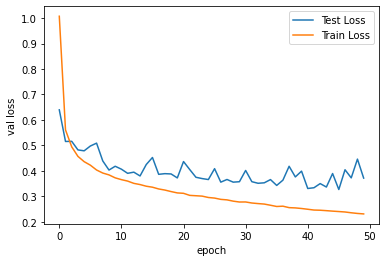

In [ ]:
sns.lineplot(x='epoch', y='val loss', data=fc_results, label='Test Loss')
sns.lineplot(x='epoch', y='train loss', data=fc_results, label='Train Loss')

THe training loss is consistently heading down, which is normal. When our model trains on a specific set of data, and it gets to see the same data over and over (thats what an epoch is, seeing all the data once!) the model gets _unreasonable_ good at predicting the right answer for the training data. Thats classic over-fitting. We see that with the loss on the test data, it does _not_ consistently get better with each epoch. In fact the test loss begins to stabilize or "plateau" after a certain point. 

If the test loss as stabilized, that would be a good time to reduce the learning rate. If we are already at an optimal location, reducing the learning rate is not going to hurt anything. If we are bouncing around a better solution, reducing the learning rate could help us improve based on the same logic we used to justify exponential decay. But now we would be reducing the learning rate _when it appears necessary based on the data_, rather than at some fixed arbitrary schedule. 

This is the idea behind the "Reduce Learning Rate on Plateau" schedule, implemented by the `ReduceLROnPlateau` class in PyTorch. This is also what the `step` function needs the last validation loss passed in as an argument in our code, which looked like `lr_schedule.step(results["val loss"][-1])`. This is so that the `ReduceLROnPlateau` class can compare the current loss to the recent history of losses. 

`ReduceLROnPlateau` has three primary arguments you need to look at to control how well it works. Firs is the `patience` argument, which tells us how many epochs of no-improvement we want to see before reducing the learning rate. A value of 10 is common here, as you don't want to pre-maturely drop the learning rate. Instead you want some consistent evidence that no more progress is being made before changing speed. 

Second is the `threshold` which defines what counts as "not improving". A threshold of exactly 0 would say that we are improving if were are _any_ amount lower than the previous best loss in the past `patience` epochs. That might be _too_ pedantic, because you loss could be decreasing in minute but meaningless amounts every epoch. If we used a threshold of 0.01, we are saying that the loss needs to decrease by more than 1% for it to count as an improvement. But that could also be a little too loose, as when you train for hundreds of epochs you could be making slow but steady progress and _reducing_ the learning rate is unlikely to speed up convergence! It can take some work setting this _just_ right, so we will stick the default value of `0.0001`. 

The last parameter is the `factor` by which we want to drop the learning rate $\eta$ every time we determine that we have hit a plateau. This works the same way that $\gamma$ does for the `StepLR` class. Again, values in the range of $0.1$ to $0.5$ are all reasonable choices. 

_But_, there is one critical thing we need to recognize before using the `ReduceLROnPlateau` schedule. You can't use the test data to choose when to alter the learning rate! This _will_ cause over-fitting, because you are using information about the test data to make decisions and then using the test data to evaluate your results! 

Instead, you need to have a training, validation, and testing split! Our normal code has been using validation as the test data, which was fine because we were not _looking_ at the validation data to make any kinds of decisions while training. 

The below code shows how to do this properly. First we use the `random_split` class to create an 80/20 split of the _training_ data. The 20% split will become our validation set that is used by `ReduceLROnPlateau` to check if we should drop the learning rate, and the 80% is used to actually train the model parameters $\Theta$. Then pay attention to the call to _train_network_ were we use the `train_loader`, `val_loader`, and `test_loader` to set each of the three components properly. When we look at the results of this model, we need to make sure that we are looking at the _test_ results and not the _val_ results! Other than these careful precautions, the code is not that different than before! 

In [ ]:
fc_model.apply(weight_reset)

train_sub_set, val_sub_set = torch.utils.data.random_split(train_data, [int(len(train_data)*0.8), int(len(train_data)*0.2)])

train_sub_loader = DataLoader(train_sub_set, batch_size=B, shuffle=True)
val_sub_loader = DataLoader(val_sub_set, batch_size=B, shuffle=True)
#test loader stays the same, never alter or peek on your test data! 


optimizer = torch.optim.SGD(fc_model.parameters(), lr=eta_0)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=10)

fc_results_plateau = train_network(fc_model, loss_func, train_loader, val_loader=val_sub_loader, test_loader=test_loader, 
                                   epochs=epochs, optimizer=optimizer, lr_schedule=scheduler, score_funcs={'Accuracy': accuracy_score}, device=device)

\title{Don't shoot yourself in the foot!}Plateau based adjustments to the learning rate are a _very_ popular and successful strategy. By using information about how well the current model appears to be done, it often gets the best results on many problems. _But_ , you should not blindly use it in all circumstances! There are two particular cases were the `ReduceLROnPlateau` might perform poorly or even _mislead_ you into an over-confident result. 

First is the case were you just don't have a lot of data. The `ReduceLROnPlateau` strategy requires a training and validation set to work, and so reduces the amount of data you have for learning the model parameters. If you only have 100 training points or some other small number, it could be painful to have to take 10-30% aside for validation. You need to have enough data both to estimate the parameters $\Theta$ and to _actually_ tell if the learning has plateaued, and if you don't have a lot of data that may just be too tall an order to fill. 

The second case is when your data strongly violated the Identically and Independently Distributed (I.I.D.) assumption. For example if your data has multiple samples from the same person, or events that depend on the date they occurred (e.g., if you want to predict the weather you can't have data from the future!), naively applying a random split to create the validation set can lead to poor results. In this situation you need to be very careful to make sure that your training, validation, and testing splits don't have any accidental leakage from one to the other. Using the weather example, you might want to make sure your training data has data from _only_ the years 1980-2004, validation data with 2005-2010, and then your test data with 2011-2016. This way no accidental "time traveling" will occur which would be a big I.I.D. violation. 

## Comparing the Schedules 

Now that we have trained four common learning rate schedules we can compare their results and see which performed best! The results are shown in the below plot, with the test accuracy on the y-axis. Some tends are quickly obvious and worth talking about. Starting with vanilla SGD, we can see that it does _fine_ but is constantly fluctuating up and down from epoch to epoch. Every learning rate schedule we are looking at provides _some_ kind of benefit. 

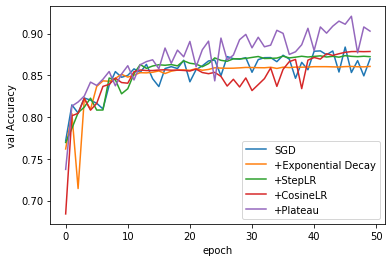

In [ ]:
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results, label='SGD')
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results_expolr, label='+Exponential Decay')
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results_steplr, label='+StepLR')
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results_coslr, label='+CosineLR')
sns.lineplot(x='epoch', y='test Accuracy', data=fc_results_plateau, label='+Plateau')


The Exponential decay has the benefit of being _smooth and consistent_, from epoch to epoch it has almost identical behavior. Unfortunately it is trending toward the lower-side of accuracy, and ends up doing a little bit worse than naive SGD. But consistency has value, and if we happed to end one epoch sooner SGD would have been performing worse. 

The `StepLR` schedule is very similar to the exponential one in behavior, with a bit more asperity in the beginning as it goes fast before slowing down and stabilizing later in training. This ends up on the higher end of SGD in performance. 

The Cosine schedule ultimately does a little better still, reaching the highest accuracy of naive SGD, `StepLR`, or exponential decay. You can see around 27 epochs in that performance drops suddenly as the learning rate ramps back up, before re-stabilizing at a higher accuracy once the learning rate decays again. This is why I recommend setting the cosine approach so that it ends on a "dip". 

Yet all of these approaches were defeated by the `Plateau` based approach! Its the only strategy that reached 90% accuracy, handily ending with the best total results. The degree that it is doing better is slightly exaggerated by us choosing an aggressive initial learning rate $\eta_0$, but the results still show why its a popular schedule to use. The feedback from how the model is _actually_ doing, rather than assuming some kind of behavior, can help get every last bit of accuracy out of your model.

Despite how well it does, we won't use it much in the course of this book. Part of that is because it requires extra code that can be a bit distracting when we are trying to focus on new concepts. Sometimes we are also going to set up learning problems in a _specific_ way so that you see some real-world behavior on problems that only take a few minutes to run instead of hours or more, and the Plateau approach make it harder to set some of these scenarios up. But hopefully these initial results show that you should keep it in mind as a powerful approach in your arsenal! 

# Making Better Use of Gradients


We now know several ways that we can alter the learning rate $\eta$ to improve how quickly our model learns, and allow it to learn more accurate solutions. This was done by defining different learning rate schedules $L(\cdot, \cdot)$. Now we will achieve the same goals by modifying the gradient with a function $G(\cdot)$. We will focus on these gradient update schemes on their own first, and then combine them with the learning rate schedules to get improved results! First we will talk about some broad motivation, and then dive into the most common approaches used to fix achieve this. 

Remember that we are using $\boldsymbol{g}^t$ to indicate the $t$'th gradient that we are receiving to update the network. Because we are doing stochastic gradient descent in batches, this is a noisy gradient. Even with the noise in $\boldsymbol{g}^t$ there is valuable information in $\boldsymbol{g}^t$ we are not fully utilizing. Consider the $j$'th parameter's gradient $\boldsymbol{g}^t_j$. What if its consistently almost the same value, every time? Mathematically that would be a situation where:

$$\boldsymbol{g}^t_j \approx \boldsymbol{g}^{t-1}_j \approx \boldsymbol{g}^{t-2}_j \approx \boldsymbol{g}^{t-3}_j \approx \ldots$$

This is telling us the $j$'th parameter consistently needs to be moved in the same direction each time. The below figure shows a situation where this can happen. 

![Example where the gradient value could consistently return the same value over and over again. We are heading on a direct path toward the solution, but we could get there faster if we used a larger learning rate.](https://drive.google.com/uc?export=view&id=1plTHVPr8ajHFUq2_QiF5x7VVHcrlyq1K)

We don't necessarily want to increase the learning rate $\eta$ because there are other dimensions that may have different behavior. Every parameter of the network is going to get it's own gradient value and our networks can have millions of parameters! So if the gradient at index $j$ is consistently the same, maybe we should be increasing how far we step (i.e., increase learning rate $\eta$) for _just_ index $j$? We would need to make sure this is done only with respect to index $j$, because the gradient for a different index $i$ might not be as consistent! 

So, the idea becomes: we would like to have a global learning rate $\eta$, and individualized learning rates $\eta_j$ for all of the parameters! While the global learning rate will stay fixed, we will let some algorithm adjust each of the $\eta_j$ values to try and improve convergence. Most gradient update schemes work by re-scaling the gradient $\boldsymbol{g}^t$ which is equivalent to giving each parameter it's own personalized learning rate $\eta_j$. 

## SGD with Momentum

As we described the idea of using gradient information above, we want to increase the learning rate if the gradient for parameter $j$ is consistently heading in the same direction. One may describe this as wanting the gradient to "build momentum". If the gradient in one direction keeps returning similar values, it should start taking bigger and bigger steps in the same direction!  The below figure shows an example problem that momentum can help fix. 

![The naive optimization is almost stuck oscillating between the top-left and bottom-right directions, but slowly making progress in the top-right direction that leads to the solution. This is a _consistent_ direction and if we could build some momentum in the top-right direction we would not need so many steps! ](https://drive.google.com/uc?export=view&id=1bn2jPG1BjUZ6-fBjXjydsO3bU_8UbObF)

This "momentum" strategy was one of the first developed for improving SGD and solving the above problem, and is still widely used today. Lets talk about the math of how it works. 

Our normal gradient update equation, again, looks like this:

$$\Theta_{t+1} = \Theta_t - \eta \cdot \boldsymbol{g}^{t} $$

The initial version of the moment idea, is to have a momentum weight $\mu$, which will have some value in the range of $(0, 1)$ (i.e., $\mu \in (0, 1)$) \footnote{I think using $\mu$ for momentum is confusing, but its the most-common notation, so I'm sticking with it so you can learn it!}. Next we will add a velocity  term, that well call $\boldsymbol{v}$, which accumulates our momentum! So our velocity $\boldsymbol{v}$ will contain a fraction ($\mu$) of our previous gradient step, as detailed in the below equation. 

$$\overbrace{\boldsymbol{v}^{t+1}}^{\text{The new momentum} } = \overbrace{\mu \cdot \boldsymbol{v}^t}^{\text{a fraction of the current momentum }}+\overbrace{\eta \cdot \boldsymbol{g}^t}^{\text{the current direction }} $$

Because our velocity is dependent on our previous velocity, it its taking into account all of our previous gradient updates! Next, we simply use $\boldsymbol{v}$ in place of $\boldsymbol{g}$ to perform our gradient update!

$$\Theta^{t+1} = \Theta^t - \boldsymbol{v}^{t+1}$$

You may look at the above equations and be concerned, if we are taking into account all of our old gradients, what if some of them are no longer useful? Thats why we keep the momentum term $\mu \in (0, 1)$. If we are currently at update $t$, and we think about the past gradient from $k$ steps ago, it's contribution is $\mu^k \boldsymbol{g}^t$, which will get small quickly! So if we have $\mu = 0.9$, then the gradient 40 steps ago is only contributing a weight of $0.9^{40} \approx 0.01$ to the current velocity $\boldsymbol{v}$. The value $\mu$ helps us forget past gradients so that learning can adapt, while also allowing it to grow larger if we are always heading in the same direction. 

The above strategy is a simple way to often significantly improve the accuracy and training time of your model! It is capable of solving both of the problems we have shown so far, the below figure shows what those solutions look like.

![On the left we see momentum solving the small learning rate problem. The direction is consistent, sot he momentum will build and increase the effective learning rate. On the right the momentum builds in the consistent, but initially small, top-right direction. The oscillation may continue but fewer steps are needed to reach the minimum.   ](https://drive.google.com/uc?export=view&id=1mcSsrYOAjsSLrYkfx7swR2DvQh82Ai7l)

In fact, if you want to get the _best possible_ accuracy from your network, SGD with some form of momentum is still considered one of the best options. The down side is finding the combination of $\mu$ and $\eta$ values that gives the _absolute best results_ is not an easy task, and requires training many models. Well talk about smarter ways to search for $\mu$ and $\eta$ in the last section of this chapter.

### Nestrov Momentum

A second flavor of Momentum exists and is worth mentioning, as it often performs better in practice. This version is called Nestrov momentum. 

In normal momentum, we take the gradient with respect to the current weights (that is $\boldsymbol{g}^t$), and then move in the direction of our gradient and velocity combined. If we have built up a _lot_ of momentum, it can be difficult for us to make turns during the optimization. Lets look at a toy example of what can go wrong in in yet another artistic masterpiece that is the below figure. 

![Imagine it has taken a long time to reach this point, and so the optimizer has built up a large momentum (i.e., $\|\boldsymbol{v}^t\|_2 > 0$). When we reach the purple point the momentum causes us to swerve _around_ the desired area. This is because the momentum, even after decay, is larger than the gradient. Since it is larger, it carries the weights more in the same direction rather than a new one.  ](https://drive.google.com/uc?export=view&id=1tZwQ86R8vG8qQ_V6GUkO2HQlgiw-b2-h)

Technically the above problem shows momentum behaving "correctly", the momentum is carrying $\Theta_{t+1}$ in a consistent direction. Its just not a good idea any more, and it will take a few iterations for the momentum to be corrected and start heading toward the actual solution. 

In _Nestrov_ momentum, we instead decide to be patient. Normal momentum at step $t$ immediatly calculates the new gradient $\boldsymbol{g}^t$ and adds the velocity $\boldsymbol{v}^t$. Nestrov first acts on the velocity, and _then_ calculates a new gradient _after_ letting the momentum move us. This way if we are in the _wrong_ direction, Nestrov will likely have a larger gradient to push us back in the correct direction sooner.   This looks like the below sequence of equations:

$$\Theta^{t+1/2} = \Theta^{t} - \mu \cdot  \boldsymbol{v}^t $$

$$\boldsymbol{v}^{t+1} = \mu \cdot \boldsymbol{v}^t + \eta \cdot \underbrace{\nabla_{\Theta^{t+1/2}} f_{\Theta^{t+1/2}}(\boldsymbol{x})}_{\boldsymbol{g}^{t+1/2}} $$

$$\Theta^{t+1} = \Theta^{t} - \boldsymbol{v}^{t+1}$$

The first equation alters the parameters $\Theta$ based on _only_ the current velocity (that means no new batch and no new information yet!). The second equation computes a _new_ velocity using the old velocity and the gradient _after_ having alter $\Theta$ from the first equation. Finally the third equation takes a step based on these results. The below figure shows how Nestrov momentum would effect the previous example. 

![At the same purple point, the right side shows how the update is calculated. Instead of computing $\boldsymbol{g}^t$ at the starting point, we first follow the momentum which is in the _wrong_ direction. This causes the gradient at this new location to be larger back in the _correct_ direction. Combined, we get a smaller step that is closer to the solution. The original standard momentum result is shown faded in black. ](https://drive.google.com/uc?export=view&id=1DhrtEbxnsxpmV1etOGamCnOEwGiUQgU9)

Lets try and verbally (well, its verbal if you read out loud) reason through another scenario to exercise our mental model of what is happening. Consider drawing a diagram of this yourself to help you reason through it! 

Consider the standard momentum case where our momentum has been useful, allowing us to head in the correct direction, and we have just reached our goal! We are at the function's minimum, and the problem is solved! But,  _we don't ever know for sure that we are at the minimum_, and so we run the next step of the optimization process. Because of the momentum we have built up,  we are about to roll past the minimum! In normal momentum, we compute the gradient - and we if are at the solution, the gradient $\boldsymbol{g}^t=0$, so no change change. Then we add the velocity $\boldsymbol{v}^t$, and it carries us away! 

Now, think about this scenario under Nestrov momentum. We are at the solution, and first we follow the velocity, pushing us away from the goal. Then we calculate the gradient, which recognizes we need to head back in the opposite direction, and thus heads toward the goal. When we add these two together, they will almost cancel out (if we take a smaller step forward or backward depends on what has a larger magnitude, $\boldsymbol{g}^t$ or $\boldsymbol{v}^t$).  In one step we have already started to change the direction our optimizer is headed in, where normal momentum would take two steps!

This is the intuition and reasoning why Nestrov momentum is usually the preferred version of momentum. Now that we've talked about the ideas, we can turn them into code very easily. The `SGD` class simply requires us to set the `momentum` flag to a non-zero value if we would like momentum, and `nestrov=True` if we want it to be a nestrov momentum! The below code will train our network with both version. 


In [ ]:
fc_model.apply(weight_reset)

optimizer = torch.optim.SGD(fc_model.parameters(), lr=eta_0, momentum=0.9, nesterov=False)

fc_results_momentum = train_network(fc_model, loss_func, train_loader, val_loader=test_loader, epochs=epochs, optimizer=optimizer, score_funcs={'Accuracy': accuracy_score}, device=device)

In [ ]:
fc_model.apply(weight_reset)

optimizer = torch.optim.SGD(fc_model.parameters(), lr=eta_0, momentum=0.9, nesterov=True)

fc_results_nestrov = train_network(fc_model, loss_func, train_loader, val_loader=test_loader, epochs=epochs, optimizer=optimizer, score_funcs={'Accuracy': accuracy_score}, device=device)

Below we plot the results from vanilla SGD and both flavors of momentum. You should see that both momentum versions perform dramatically better, learning faster and more accurate solutions! But your won't usually see one version of momentum perform dramatically better or worse than the other. While Nestrov does solve a real problem, it is also the case that normal momentum will _eventually_ correct itself after more gradient updates.  Still I prefer to use the Nestrove flavor as my experience is that if one is going to be better by a non-trivial amount, it is usually Nestrov. 

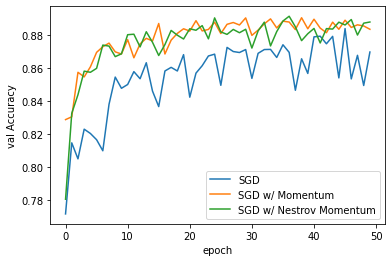

In [ ]:
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results, label='SGD')
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results_momentum, label='SGD w/ Momentum')
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results_nestrov, label='SGD w/ Nestrov Momentum')

## Adam

One of the currently most popular techniques is called Adaptive Moment Estimation, or Adam for short. Adam is strongly related to the SGD with Momentum we just described above. To make our math consistent with how you will read about it in other places, we have to re-name a few terms. The velocity $\boldsymbol{v}$ will become $\boldsymbol{m}$ and the momentum weight $\mu$ will become $\beta_1$. Now we can describe the first step of Adam which has one major change shown in red below:

$$\boldsymbol{m}^t = \beta_1 \cdot \boldsymbol{m}^{t-1} + \color{red}{(1 - \beta_1)} \cdot \boldsymbol{g}^t$$ 

This describes the momentum update equation but we are now down-weighting the _current_ gradient $\boldsymbol{g}^t$ by ($1-\beta_1$). This makes $\boldsymbol{m}^t$ a _weighted average_ between the previous velocity and the current gradient. 

Since we are now talking about momentum as an _average_ or _mean_ gradient over multiple updates, we could also talk about the _variance_ of the gradient as well! If one parameter $g^t_j$ had high variance, we probably don't want to let it contribute too much to the momentum, because it has a high variance and so will likely change again! If a parameter $g^t_j$ had _low_ variance, then its a reliable direction to head in, so we should give it _more_ weight in the momentum calculation.  

To implement this idea we can calculate information about the variance over time by looking at squared gradient values! Normally, for variance, we would want to subtract the mean before squaring, but that is hard to do in this scenario. So well use just the squared values as an _approximation_ of the variance and keep in mind that this  is not getting us perfect information, but leads the below variance of velocity equation $\boldsymbol{v}$: 

$$\boldsymbol{v}^t = \beta_2 \cdot \boldsymbol{v}^{t-1} + (1 - \beta_2) \cdot \boldsymbol{g}^t \odot \boldsymbol{g}^t $$

We will save $\boldsymbol{m}^t$ and $\boldsymbol{v}^t$ but we will perform one more alteration before using them. Why? Because when we are early in the optimization process, meaning $t$ is a small value,  $\boldsymbol{m}^t$ and $\boldsymbol{v}^t$ actually give us biased estimates of the mean and variance. They are biased because they are initialized to zero (i.e., $\boldsymbol{m}^0 = \boldsymbol{v}^0 = \vec{0}$), so the early estimates will be _too small_ if we used them naively. 

Think about when $t=1$. In that case, the value of $\boldsymbol{m}^1 = (1 - \beta_1) \cdot \boldsymbol{g}$. The true average at this just $\boldsymbol{g}$, but instead we have discounted it by a factor of $1-\beta_1$! To fix this, we will just adjust as so:

$$\hat{\boldsymbol{m}} = \frac{\boldsymbol{m}^t}{1-\beta_1^t}$$
$$\hat{\boldsymbol{v}} = \frac{\boldsymbol{v}^t}{1-\beta_2^t}$$

Now we have $\hat{\boldsymbol{m}}$ and $\hat{\boldsymbol{v}}$ that give us the unbiased estimates of the mean and variance, we use both together to update our weights $\Theta$. 

$$\Theta^{t+1} = \Theta^{t} - \frac{\eta \cdot \hat{\boldsymbol{m}} }{\sqrt{\hat{\boldsymbol{v}}} + \epsilon} $$

So what is going on here? The numerator $\eta \cdot \hat{m}$ is computing the SGD with momentum term, but now we are normalizing each dimension by the variance! That way if a parameter has naturally large swings in its value, we won't adjust as quickly to a new large swing --- because it is normally quite noisy! If a parameter normally has a small variance and is very consistent, we will adapt quickly to any observed change! The $\epsilon$ term is literally just a very small value, so that we never end up dividing by zero. 

That gives you the intuition behind Adam! The original authors proposed using the following values: $\eta=0.001$, $\beta_1=0.9$, $\beta_2=0.999$, and $\epsilon=10^{-8}$. 

Personally, I recommend using Adam, or one of its descendants, as my default choice for any optimization problem. Why? Its an optimizer that, using the above default values, will usually perform well with no further alteration. It may not get you the _best possible_ performance, and you could often improve results by adjusting all these parameters, but the defaults will usually work well. And if they don't work, its not often the case that some other setting of the parameters will fix it. 

Most optimizers don't share this same property, or not to the degree that Adam exhibits it. For example, SGD is very sensitive to the momentum and learning rate terms, and you usually need to do some level of tuning in order to get good performance out of normal SGD. Since Adam does not _require_ this finicky tuning  you don't have to do as much experimentation with Adam in order to figure out what works. Thus you can save a detailed optimization process until after you have settled on your final architecture, and are ready to squeeze out every last drop of accuracy you can get. Ultimately this makes Adam a great time saver, spend the time on your architecture and leave changes to the optimizer until you are nearly done and looking for the last ounce of accuracy that is possible. 



\title{Other Flavors of Adam} The original paper for the Adam algorithm actually had a mistake in it, but still, their proposed algorithm worked well for the vast majority of problems. A version that has fixed this mistake is called `AdamW`, and is the default we will use in this course. 

Another extension of Adam is called NAdam, where the N stands for Nestrov. As you might guess, this version adapts Adam to use Nestrov style momentum rather than the standard momentum. A third flavor is AdaMax, which replaces some of the multiplication operations in Adam with $\max$ operations, with the goal of improving the numerical stability of the algorithm. 

All of these different flavors have various pros and cons that are beyond the scope of this course, but any Adam variant will serve you well. 


Now that we have learned about Adam, lets try it out! The below code will again re-set the weights for the neural network we have been training over and over, but using `AdamW` this time. 

In [ ]:
fc_model.apply(weight_reset)

#We don't set the learning rate for Adam because it's default is the one you should probably 
#always use, and it can be more sensitive to large changes in learning rate
optimizer = torch.optim.AdamW(fc_model.parameters())

fc_results_adam = train_network(fc_model, loss_func, train_loader, val_loader=test_loader, epochs=epochs, optimizer=optimizer, score_funcs={'Accuracy': accuracy_score}, device=device)

Below we can plot `AdamW` along with the three versions of SGD we have already looked at. The result you will usually see is that AdamW performs as good as SGD with either flabor of momentum, but with a bit more stable behavior were the dips down are not as frequent or dramatic. 

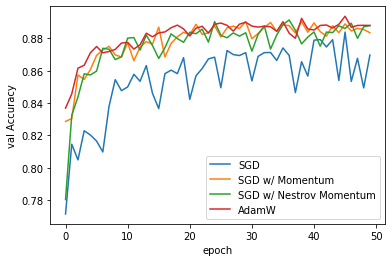

In [ ]:
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results, label='SGD')
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results_momentum, label='SGD w/ Momentum')
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results_nestrov, label='SGD w/ Nestrov Momentum')
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results_adam, label='AdamW')

We can also combine these new optimizers with the learning rate schedules we have already learned about. Below well train Adam and SGD with Nestrov momentum combined with the Cosine Annealing schedule. 

In [ ]:
#Adam with Cosine Annealing
fc_model.apply(weight_reset)
optimizer = torch.optim.AdamW(fc_model.parameters())

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs//3)
fc_results_adam_coslr = train_network(fc_model, loss_func, train_loader, val_loader=test_loader, epochs=epochs, optimizer=optimizer, lr_schedule=scheduler, score_funcs={'Accuracy': accuracy_score}, device=device)

#SGD+Nestrov with Cosine Annealing 
fc_model.apply(weight_reset)
optimizer = torch.optim.SGD(fc_model.parameters(), lr=eta_0, momentum=0.9, nesterov=True)

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs//3)
fc_results_nestrov_coslr = train_network(fc_model, loss_func, train_loader, val_loader=test_loader, epochs=epochs, optimizer=optimizer, lr_schedule=scheduler, score_funcs={'Accuracy': accuracy_score}, device=device)

Now we can compare the results with and without the cosine schedule in the below code and plot. Again we see a similar trend, that adding the learning rate schedule gives a bump to accuracy, and that the version with `AdamW`is _slightly_ better behaved. 

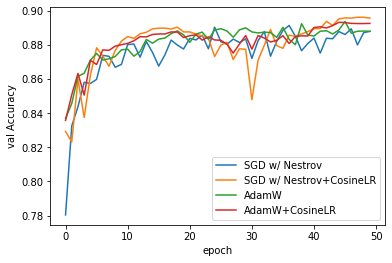

In [ ]:
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results_nestrov, label='SGD w/ Nestrov')
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results_nestrov_coslr, label='SGD w/ Nestrov+CosineLR')
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results_adam, label='AdamW')
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results_adam_coslr, label='AdamW+CosineLR')

\title{The Interplay between $L(\cdot, \cdot)$ and $G(\cdot)$} The learning rate schedule and gradient updates ultimately tackle similar goals, so why do they work even better together than apart? One way is to think about them as working on two different time scales. The learning rate schedule $L(\cdot, \cdot)$ is operating _once per epoch_ to adjust the global rate of progress. The gradient update functions $G(\cdot)$ are operating on _every_ batch, so thousands to millions of times per epoch depending on how much data you have! So you can think of these things as balancing between long term and short term strategies to minimize a function. Like most things in life, its better to play the balance than focus purely on short or long term goals. 

## Gradient Clipping 

We have one last trick to talk about, which is compatible with both the optimizers like Adam and SGD as well as the learning rate schedules. It is called _gradient clipping_, and it helps us solve the exploding gradient problem. Unlike all the mathematical intuition and logic that went into everything so far, gradient clipping is refreshingly simple: if any value in a gradient is later than some threshold $z$, just set it to a maximum value of $z$. So if we use $z=5$, and our gradient is $\boldsymbol{g} = [1, -2, 1000, 3, -7]$ the clipped version will become $\operatorname{clip}_5(\boldsymbol{g}) = [1, -2, 5, 3, -5]$. The idea is that any value larger than our threshold $z$ clearly indicates the _direction_, but is set to an unreasonable _distance_ so we will forcibly clip it to something that is reasonable. 

The below code shows how to add gradient clipping to any neural network. We grab the parameters $\Theta$ using the `model.parameters()` function, and use the `register_hook` to register a callback that is executed every time the gradients are used. In this case we simply take the tensor `grad` that represents the gradients, and use the `clamp` function that returns a new version of `grad` where nothing is smaller than `-5` or larger than `5`. Thats all it takes!

In [ ]:
fc_model.apply(weight_reset)

for p in fc_model.parameters():
    p.register_hook(lambda grad: torch.clamp(grad, -5, 5))

# optimizer = torch.optim.SGD(fc_model.parameters(), lr=eta_0, momentum=0.9, nesterov=True)
optimizer = torch.optim.AdamW(fc_model.parameters())


scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs//3)
fc_results_nestrov_coslr_clamp = train_network(fc_model, loss_func, train_loader, val_loader=test_loader, epochs=epochs, optimizer=optimizer,  lr_schedule=scheduler, score_funcs={'Accuracy': accuracy_score}, device=device)

Now if we plot the results below you should see... not that much. The results will _usually_ be the same. In this case they are a little bit worse, but could have easily been a little bit better instead. It just depends on the problem. 

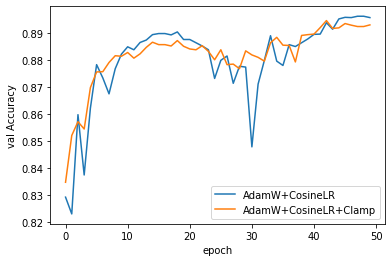

In [ ]:
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results_nestrov_coslr, label='AdamW+CosineLR')
sns.lineplot(x='epoch', y='val Accuracy', data=fc_results_nestrov_coslr_clamp, label='AdamW+CosineLR+Clamp')

This is because exploding gradients are usually a _catastrophic_ problem. If your model has them, its probably learning a degenerate solution or not converging at all, and would stand out badly. Since this dataset and network don't have that problem, there isn't much benefit for gradient clipping. 

In most applications I don't use gradient clipping unless my models are not learning well to begin with. If they learn well I probably don't have exploding gradients, so I'll focus on other changes. If the model isn't good, I'll test gradient clipping to see if that fixes the problem. If I'm working with Recurrent Neural Networks I will _always_ use gradient clipping because the recurrent connections tend to cause exploding gradients, making them a common issue in that scenario. But if you wanted to always include clipping that is an equally valid strategy. Using a clip value of $z=5$ or $z=10$ are common and generally work well for most problems. 

# Hyper-parameter Optimization

Noe that we have improved how do do training, we are going to re-use much of these techniques across all of the future material in this course. All of these improvements so far have been focused on optimizing when we have gradients. But there are things we would like to optimize for which we do not have any gradients! Things like the initial learning rate $\eta$ to use, and the value of the momentum term $\mu$, are some obvious ones. But we would also like to optimize the architecture of our networks too! Should we be using 2 layers or 3? How about the number of neurons in each hidden layer? These are things we could also optimize. 

The first hyper-parameter tuning method most people learn is a technique called _grid search_.  While valuable, grid search really only works well for optimizing one or two variables at a time. When training a neural network, we usually have many more parameters to optimize though! 

## Optuna

To perform a smarter type of hyper parameter optimization, we will use a library called Optuna. Optuna can be used with any framework, so long as you can describe the goal as a single numeric value. Lucky for us, we have accuracy or the error as our goal, so we can use Optuna! Optuna does a better job at hyper-parameter optimization by using a Bayesian technique to model the hyper-parameter problem as it's own machine learning task. We could spend a whole chapter (or four!) on the technical details of how Optuna works, but instead we are just going to focus on Optuna as a tool. 

To start, lets just see a little bit about how Optuna works. Similar to PyTorch, it has a "define by run" concept. For Optuna we define a function that we want to minimize (or maximize), which takes as input a `trial` object. This `trial` object is used to get `guesses` for each parameter we want to tune, and returns a score at the end. The returned values are floats and integers just like we would use ourselves, making it easy to use. 

So, lets start with a toy function that we want to minimize $f(x, y) = ((x-3)\cdot(y+2))^2$. Its easy to tell one minimum exists at $x=3$ and $y=-2$. But can Optuna figure that out? First we need to import the Optuna library

In [ ]:
#If you don't have optuna installed, uncomment the below line of code
!pip install optuna

     |████████████████████████████████| 256kB 9.0MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 81kB 5.8MB/s 
     |████████████████████████████████| 163kB 13.8MB/s 
     |████████████████████████████████| 143kB 19.4MB/s 
     |████████████████████████████████| 112kB 22.0MB/s 
     |████████████████████████████████| 51kB 6.8MB/s 
     |████████████████████████████████| 81kB 9.1MB/s 
  Created wheel for optuna: filename=optuna-2.2.0-cp36-none-any.whl size=340928 sha256=81019f6af05a14f9771db463692144ac4cc2728ab8a5a3ef1125d8b8ef6bccaf
  Stored in directory: /root/.cache/pip/wheels/a6/27/26/3ef57a8fb2c8bceef3f4ece73483cec1895e06eae442d34a41
Successfully built optuna
  Created wheel for pyperclip: filename=pyperclip-1.8.0-cp36-none-any.whl size=8693 sha256=6325790d3486e44eb42850554046399cb51f2b56324f95db04fb03f659f5051e
  Stored in directory: /root/.cache/pip/wheels/b

In [ ]:
import optuna

Next we need to define the function to be minimized. Well do this below with a `toyFunc` that takes in the `trial` object. Optuna figures how how many hyper-parameters exist by us using the `trial` object to obtain a guess for each parameter. This happens with the `suggest_uniform` function, which requires us to provide a range of possible values (something we must do for any hyper-parameter optimization approach). 

In [ ]:
def toyFunc(trial):
    x = trial.suggest_uniform('x', -10.0, 10.0)
    y = trial.suggest_uniform('y', -10.0, 10.0)
    
    return abs((x-3)*(y+2))

Thats all we needed to do, now we can use the `create_study` function to build the task and call `optimize` with the number of trials we want to let Optuna have at minimizing the function. 

In [ ]:
study = optuna.create_study(direction='minimize')
study.optimize(toyFunc, n_trials=100)

[I 2020-10-05 23:59:09,811] A new study created in memory with name: no-name-c0bdc42d-e52d-4775-acf5-d5eeca2dbdcd
[I 2020-10-05 23:59:09,816] Trial 0 finished with value: 13.563110615541872 and parameters: {'x': 5.541744160874778, 'y': -7.336143119484508}. Best is trial 0 with value: 13.563110615541872.
[I 2020-10-05 23:59:09,819] Trial 1 finished with value: 36.99208464134328 and parameters: {'x': -9.217572455000901, 'y': 1.0277769808683779}. Best is trial 0 with value: 13.563110615541872.
[I 2020-10-05 23:59:09,823] Trial 2 finished with value: 7.18247983441946 and parameters: {'x': 4.830274149186241, 'y': 1.9242644811504679}. Best is trial 2 with value: 7.18247983441946.
[I 2020-10-05 23:59:09,828] Trial 3 finished with value: 30.867930909451275 and parameters: {'x': -1.0190687933859905, 'y': -9.680368885511317}. Best is trial 2 with value: 7.18247983441946.
[I 2020-10-05 23:59:09,834] Trial 4 finished with value: 1.2367729353400043 and parameters: {'x': 2.807783851297991, 'y': -8.4

You should see a long list of output when you run the above code that looks something like this:
```
Finished trial#12 with value: 2.285 with parameters: {'x': 0.089, 'y': -2.785}. 
Best is trial#9 with value: 0.535.
Finished trial#13 with value: 3.069 with parameters: {'x': -1.885, 'y': -2.628}. 
Best is trial#9 with value: 0.535.
Finished trial#14 with value: 0.018 with parameters: {'x': -3.183, 'y': -1.997}. 
Best is trial#14 with value: 0.018.
```

When I ran this code Optuna got a very precise answer, with $5.04\cdot 10^{-5}$ being very close to the true minimum of zero! The values it returned are also close to what we knew was the true answer. We can access these using the ` study.best_params` which contains a `dict` object mapping each hyper-parameter to the value that, in combination, gave the best result. 

In [ ]:
study.best_params

{'x': 3.032393291313523, 'y': -2.0441098141759664}

We can also use the study object to get information about the optimization process that happened. The reason Optuna is powerful is that it uses machine learning to try and explore the space of parameter values. By specifying the parameters, with min and max values, we give Optuna the constraints --- and it attempts to balance exploring the space so that it understands what it looks like, and minimizing the score based on its current understanding of the space. 

We can use a contour plot to get an example of this. 

In [ ]:
optuna.visualization.plot_contour(study)

Notice how Optuna has spent most of its effort testing values near the minumum, and very few in the larger extreeme areas of the space? Optuna was able to quickly figure out that there was no way it would find a better solution in these parts of the space, and so stoped exploring those areas. This is what allows it to spend more time looking for the best solution, and to better handle more than just two parameters. 

## Optuna with Pytorch

You now know all the basics to using Optuna, its time to combine it with PyTorch to do some advanced parameter searching! We will  define a new function for Optuna to optimize our neural network. We do not want to go crazy, as optimizing without any gradients is still very difficult and Optuna is not a magic bullet. But we can use Optuna to help us make some decisions. For example, how many neurons should we have in each layer, and how many layers? Below we have re-written our training code to have Optuna figure these out for us, along with the learning rate too. 

An important thing to note here is that we have to create a new training and validation split using only the original training data. Why? Because we are going to reuse the validation set multiple times, and we do not want to overfit to the specifics of our validation data! So we create a new validation set, and save our original validation data until the very end. That way we only use the true validation data once to determine how well we did at optimizing our network architecture. 

In [ ]:
def objective(trial):
    
    train_subset = int(len(train_data)*0.8)
    test_subset = len(train_data)-train_subset
    
    split = torch.utils.data.random_split(train_data, [train_subset, test_subset])
    
    t_loader = DataLoader(split[0], batch_size=B, shuffle=True)
    v_loader = DataLoader(split[1], batch_size=B, shuffle=False)

    #Hidden layer size
    n = trial.suggest_int('neurons_per_layer', 16, 256) 
    layers = trial.suggest_int('hidden_layers', 1, 6) 
    #How many channels are in the input?
    C = 1
    #How many classes are there?
    classes = 10

    #At least one hidden layer, that take in D inputs
    sequential_layers = [
        nn.Flatten(),
        nn.Linear(D,  n),
        nn.Tanh(),
    ]
    #Now lets add in a variable number of hidden layers, depending on what Optuna gave us for the "layers" parameter
    for _ in range(layers-1):
        sequential_layers.append( nn.Linear(n,  n) )
        sequential_layers.append( nn.Tanh() )
    
    #Output layer
    sequential_layers.append( nn.Linear(n, classes) )
    
    #Now turn the list of layers into a PyTorch Sequential Module 
    fc_model = nn.Sequential(*sequential_layers)
    #What should our global learning rate be? Notice that we can ask for new hyper-parameters from optuna whenever we want!
    eta_global = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)

    
    optimizer = torch.optim.AdamW(fc_model.parameters(), lr=eta_global)

    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs//3)
    results = train_network(fc_model, loss_func, t_loader, val_loader=v_loader,
                                     epochs=10, optimizer=optimizer, lr_schedule=scheduler,
                                     score_funcs={'Accuracy': accuracy_score}, device=device, 
                                     disable_tqdm=True)

    return results['val Accuracy'].iloc[-1]  # A objective value linked with the Trial object.

The above function has very little _new_ code, most of it is the same code we have used now for several chapters to create our data loaders, construct a network `Module`, and call our `train_network` function. Some important PyTorch changes are that we set `disable_tqdm=True`, because Optuna does not play nicely with progress bars inside of the function it is trying to optimize. We also broke up the model specification into a few parts, so that the number of hidden layers is a variable and filled in with a for loop `for _ in range(layers-1):`. This is a little more verbose for small networks, but makes the same code able to handle a variety of layers and is less code if we wanted to add even more layers! 

The other changes are different `suggest` functions that Optuna provides via the `trial` object. There is `suggest_int` for integers, which makes sense for links like the number of neurons (76.8 neurons does not make sense!) and the number of layers. We already saw `suggest_uniform` which works for float values that covered by a simple random range (like the momentum term $\mu$ that should be between 0 and 1). The other important option is the `suggest_loguniform`, which gives _exponentially spaced_ random values. This is the function you should use for parameters that are altered by orders of magnitude like learning rate ($\eta=0.001$, $0.01$, or $0.1$ are all common differ by a factor of 10). 

This ends by simply training our network, and taking the validation accuracy from the last epoch. It is critical that you remember this is a _validation split_, and that we have not used the test set! We should only use the test set _after_ the hyper-parameters have been found, to determine the overall accuracy. Now the below code will search for the hyper-parameters for this problem. 

In [ ]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10) #Normally we would do more like 50-100 trials,
#but we are doing less to make sure this notebook runs in a reasonable amount of time

[I 2020-10-05 23:59:11,962] A new study created in memory with name: no-name-9de1666e-5462-490b-965b-117112c091fe


[I 2020-10-06 00:00:06,446] Trial 0 finished with value: 0.8571666666666666 and parameters: {'neurons_per_layer': 75, 'hidden_layers': 3, 'learning_rate': 0.0001562191701365015}. Best is trial 0 with value: 0.8571666666666666.


[I 2020-10-06 00:00:58,066] Trial 1 finished with value: 0.8359166666666666 and parameters: {'neurons_per_layer': 187, 'hidden_layers': 1, 'learning_rate': 7.581333069329287e-05}. Best is trial 0 with value: 0.8571666666666666.


[I 2020-10-06 00:01:52,241] Trial 2 finished with value: 0.8446666666666667 and parameters: {'neurons_per_layer': 246, 'hidden_layers': 3, 'learning_rate': 5.9234678470477224e-05}. Best is trial 0 with value: 0.8571666666666666.


[I 2020-10-06 00:02:47,326] Trial 3 finished with value: 0.8620833333333333 and parameters: {'neurons_per_layer': 228, 'hidden_layers': 5, 'learning_rate': 0.00015966866216544874}. Best is trial 3 with value: 0.8620833333333333.


[I 2020-10-06 00:03:42,606] Trial 4 finished with value: 0.8795833333333334 and parameters: {'neurons_per_layer': 230, 'hidden_layers': 5, 'learning_rate': 0.0020962915192222448}. Best is trial 4 with value: 0.8795833333333334.


[I 2020-10-06 00:04:36,413] Trial 5 finished with value: 0.7043333333333334 and parameters: {'neurons_per_layer': 41, 'hidden_layers': 2, 'learning_rate': 3.327209892498895e-05}. Best is trial 4 with value: 0.8795833333333334.


[I 2020-10-06 00:05:28,597] Trial 6 finished with value: 0.8869166666666667 and parameters: {'neurons_per_layer': 229, 'hidden_layers': 1, 'learning_rate': 0.0008396335045925767}. Best is trial 6 with value: 0.8869166666666667.


[I 2020-10-06 00:06:22,159] Trial 7 finished with value: 0.8948333333333334 and parameters: {'neurons_per_layer': 188, 'hidden_layers': 2, 'learning_rate': 0.00504570301759626}. Best is trial 7 with value: 0.8948333333333334.


[I 2020-10-06 00:07:13,866] Trial 8 finished with value: 0.8865833333333333 and parameters: {'neurons_per_layer': 235, 'hidden_layers': 1, 'learning_rate': 0.0012855461222258569}. Best is trial 7 with value: 0.8948333333333334.


[I 2020-10-06 00:08:08,934] Trial 9 finished with value: 0.882 and parameters: {'neurons_per_layer': 35, 'hidden_layers': 4, 'learning_rate': 0.0030844183540791096}. Best is trial 7 with value: 0.8948333333333334.


In [ ]:
study.best_params

{'hidden_layers': 2,
 'learning_rate': 0.00504570301759626,
 'neurons_per_layer': 188}

Above you can see the parameters that Optuna selected! Now that we have trained our network, an exercise for you is to train a new model with this information to determine what final validation accuracy you get on the true validation set. Beyond just looking at the _final_ anaswer, we can also look at the progress Optuna made over time, and other views of the optimization process. This can help us build some intuition about the range of "good" parameters. This information can be helpful when we set up new experiments, so that we can hopefully start the optimization process closer to the true solution, and thus reduce how many optimization attempts are necessary. 

Below shows one of the first and simplest options, plotting the validation accuracy (and individual trials) based on how many trials have been attempted. If we see that big improvements are still occurring, than we have a good reason to increase the number of trials that we let Optuna run with. If we see that it has plateaued for a long time, we can reduce the number of trials int he future. 

In [ ]:
fig = optuna.visualization.plot_optimization_history(study)
fig.show()

We might also want to get an idea about how each individual hyper-parameter performed with respect to the objective (in this case accuracy). That can be done with a _slice plot_ as shown below. Here we can see that in most cases 3-6 hidden layers perform well, and learning rates above $\eta > 0.001$ are also consistently good. This kind of information can help us reduce the search range in future trials, or even eliminate a hyper-parameter altogether if it seems to have little impact on the objective. Both of these will help Optuna converge to solutions with less attempts in future runs. 

In [ ]:
fig = optuna.visualization.plot_slice(study)
fig.show()

The slice plot can be an over-simplification of the world though, as it is looking at one hyper-parameter at a time, when we know that all of the hyper-parameters can interact with each other. Optuna can quickly create _contour plots_ to show interactions between each possible pair of hyper-parameters. In these situations they tend to be more informative with more tirals, but can be tricky to read. I tend to focus on the ones that visually seem to "make sense" as well behaved and meaningful to interpret, and avoid hard to read contour plots as potentially misleading due to the other hyper-parameters also contributing to the scores. 

In [ ]:
fig = optuna.visualization.plot_contour(study, params=['neurons_per_layer', 'hidden_layers', "learning_rate"])
fig.show()

Last you can look at a _line plot_ to try and get an idea about how all the hyper-parameters interact at once. The color of the line indicates the result and the line goes up-and-down based on it's value for different hyper-parameters. It can take some practice learning to read a line plot well, but they can get crowded easily as you add more trials. Again, this is but one of many tools Optuna provides you. Its _fine_ if you don't find all of them useful! 

In [ ]:
fig = optuna.visualization.plot_parallel_coordinate(study)
fig.show()

## Pruning Trials with Optuna

Another feature Optuna supports, that is particularly useful when training neural networks, is to _prune_ trials early. The idea here is that optimizing a neural network is iterative, we take multiple epochs through the dataset, and we (hopefully) improve with every epoch through the data. This is valuable information we are not using! 

Say you start testing a set of parameters and learning fails from the start, with terrible results on the first few epochs. Why continuing training it all the way until the end? Its _very unlikely_ to start as degenerate and later  become one of the best performers. By reporting intermediate results to Optuna, Optuna can prune out trials that look bad based on the trials that have already completed. 

In the below code, we have added this to the objective function. The main changes are at the end, where instead of calling `train_network` once with 10 epochs, we call it 10 times in a loop for 1 epoch each. After each epoch, we then use the `report` function of the `trial` object to let Optuna known how we are _currently_ doing, and check if we should stop. For this example, I've intentionally set the number of neurons and learning rate to a range that is too large, and will result in a number of bad models that should get pruned quickly. 

In [ ]:
def objectivePrunable(trial):
    
    train_subset = int(len(train_data)*0.8)
    test_subset = len(train_data)-train_subset
    
    split = torch.utils.data.random_split(train_data, [train_subset, test_subset])
    
    t_loader = DataLoader(split[0], batch_size=B, shuffle=True)
    v_loader = DataLoader(split[1], batch_size=B, shuffle=False)

    #Hidden layer size
    n = trial.suggest_int('neurons_per_layer', 1, 256) 
    layers = trial.suggest_int('hidden_layers', 1, 6) 
    #How many channels are in the input?
    C = 1
    #How many classes are there?
    classes = 10

    #At least one hidden layer, that take in D inputs
    sequential_layers = [
        Flatten(),
        nn.Linear(D,  n),
        nn.Tanh(),
    ]
    
    for _ in range(layers-1):
        sequential_layers.append( nn.Linear(n,  n) )
        sequential_layers.append( nn.Tanh() )
    
    #Output layer
    sequential_layers.append( nn.Linear(n, classes) )
    

    fc_model = nn.Sequential(*sequential_layers)
    
    eta_global = trial.suggest_loguniform('learning_rate', 1e-6, 1e+2)

    #We need to create the optimizer (and any learning rate schedule) outside of the train_network call so that the same optimizer is re-used between epochs
    optimizer = torch.optim.AdamW(fc_model.parameters(), lr=eta_global)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs//3)
    
    for epoch in range(10):
    
        results = train_network(fc_model, loss_func, t_loader, val_loader=v_loader,
                                         epochs=1, optimizer=optimizer, lr_schedule=scheduler,
                                         score_funcs={'Accuracy': accuracy_score}, device=device, 
                                         disable_tqdm=True)
        cur_accuracy = results['val Accuracy'].iloc[-1]
        trial.report(cur_accuracy, epoch)
        
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()

    return cur_accuracy

Now I'll call the exact same `create_study` and `optimize` functions, but I'll set `n_trails=20` to give the pruning more opportunities to occur, since the pruning is dependent on the best _current_ models found by Optuna. 

In [ ]:
study2 = optuna.create_study(direction='maximize')
study2.optimize(objectivePrunable, n_trials=20)

[I 2020-10-06 00:08:09,947] A new study created in memory with name: no-name-5d4f0bdf-9463-4c4b-a87b-17e59bd5c23f


[I 2020-10-06 00:09:04,405] Trial 0 finished with value: 0.885 and parameters: {'neurons_per_layer': 36, 'hidden_layers': 3, 'learning_rate': 0.00523393731834171}. Best is trial 0 with value: 0.885.


[I 2020-10-06 00:09:58,582] Trial 1 finished with value: 0.18533333333333332 and parameters: {'neurons_per_layer': 25, 'hidden_layers': 3, 'learning_rate': 1.0042691016940634e-06}. Best is trial 0 with value: 0.885.


[I 2020-10-06 00:10:50,485] Trial 2 finished with value: 0.16308333333333333 and parameters: {'neurons_per_layer': 242, 'hidden_layers': 1, 'learning_rate': 1.3048860825619655}. Best is trial 0 with value: 0.885.


[I 2020-10-06 00:11:46,186] Trial 3 finished with value: 0.8415 and parameters: {'neurons_per_layer': 202, 'hidden_layers': 5, 'learning_rate': 0.012201177911482385}. Best is trial 0 with value: 0.885.


[I 2020-10-06 00:12:42,617] Trial 4 finished with value: 0.09975 and parameters: {'neurons_per_layer': 245, 'hidden_layers': 6, 'learning_rate': 0.6236930145945712}. Best is trial 0 with value: 0.885.


[I 2020-10-06 00:12:48,240] Trial 5 pruned. 


[I 2020-10-06 00:12:53,489] Trial 6 pruned. 


[I 2020-10-06 00:12:58,884] Trial 7 pruned. 


[I 2020-10-06 00:13:04,361] Trial 8 pruned. 


[I 2020-10-06 00:13:09,985] Trial 9 pruned. 


[I 2020-10-06 00:14:03,272] Trial 10 finished with value: 0.7425 and parameters: {'neurons_per_layer': 144, 'hidden_layers': 3, 'learning_rate': 1.8233498306256667e-05}. Best is trial 0 with value: 0.885.


[I 2020-10-06 00:14:58,402] Trial 11 finished with value: 0.8895833333333333 and parameters: {'neurons_per_layer': 152, 'hidden_layers': 4, 'learning_rate': 0.0008198938950974612}. Best is trial 11 with value: 0.8895833333333333.


[I 2020-10-06 00:15:52,687] Trial 12 finished with value: 0.87925 and parameters: {'neurons_per_layer': 149, 'hidden_layers': 4, 'learning_rate': 0.0003693313257869679}. Best is trial 11 with value: 0.8895833333333333.


[I 2020-10-06 00:16:47,859] Trial 13 finished with value: 0.89175 and parameters: {'neurons_per_layer': 101, 'hidden_layers': 4, 'learning_rate': 0.003202649033370177}. Best is trial 13 with value: 0.89175.


[I 2020-10-06 00:17:42,684] Trial 14 finished with value: 0.872 and parameters: {'neurons_per_layer': 113, 'hidden_layers': 4, 'learning_rate': 0.0003810001162686234}. Best is trial 13 with value: 0.89175.


[I 2020-10-06 00:17:48,098] Trial 15 pruned. 


[I 2020-10-06 00:17:53,549] Trial 16 pruned. 


[I 2020-10-06 00:17:58,718] Trial 17 pruned. 


[I 2020-10-06 00:18:53,576] Trial 18 finished with value: 0.87725 and parameters: {'neurons_per_layer': 171, 'hidden_layers': 4, 'learning_rate': 0.005953949654178239}. Best is trial 13 with value: 0.89175.


[I 2020-10-06 00:18:59,324] Trial 19 pruned. 


Now you should see several `TrialState.PRUNED` logs from Optuna when you run this. We did 20 trials, and when I ran it, I saw 10 of them get pruned early! How many epochs into training were these models before they got pruned? We can have Optuna plot the results of all the trials with their intermediate values to help us understand that better! 

In [ ]:
fig = optuna.visualization.plot_intermediate_values(study2)
fig.show()

It looks like all 10 trials got pruned after just 1 or 2 epochs through the dataset. Thats very early in the process, and so Optuna has almost reduced the number of effective trials by half!  We can also see some cases were models that did not perform well were allowed to run till completion, even though "better" models got pruned early on. This happens because the pruning is based on the best models Optuna has seen _so far_. So early on Optuna lets these bad models run to completion because it does not yet know they are bad models! Only after more trials and seeing much better ones does it learn that the original ones could have been pruned. So pruning does not avoid _all_ bad models, but it can avoid many of them! 


Looking at the graph carefully, you should be able to see some cases where Optuna pruned models that were diverging (getting worse), as well as some that looked like they would improve, but were not doing well enough that they would become competitive with what Optuna had already seen. These are also good cases for pruning and part of how Optuna saves us time. 


While Optuna is one of my _favorite_ tools, we won't use it again outside of this chapter. This is purely are computational concern, as I want to keep the examples in this book to ones that will run quickly in just a few minutes. But Optuna will need to train multiple networks, which means _multiplying_ training time. Just 10 trials is not a lot but means an example that would take 6 minutes would suddenly take an hour or more! But when you are working on the job, you should _definitely_ be using Optuna to help you build your neural networks! 

# Summary 

We have learned about different optimizers, learning rate schedules, and hyper-parameter tuning, that help bring neural network techniques from the 80s and 90s into modern times. They can have a large impact on our model's accuracy and how many epochs of training we need without having to alter the model's themselves. The optimizers help us modify the gradients $\boldsymbol{g}^t$ and adapt to short-term changes during learning. The learning rate schedules modify $\eta$ and provide strategy for long-term changes during learning. Together they cover the aspects of gradient based learning that is done once we have all the hyper-parameters specified. The Optuna library can help us determine these hyper-parameters when default values don't work well, or we need to maximize our accuracy. 